## xG model - Trained and applied to combined data

In [1]:
import pandas as pd
allsvenskan = pd.read_csv('csv/allsvenskan_all.csv')
damallsvenskan = pd.read_csv('csv/allsvenskan_all.csv')

allsvenskan = pd.concat([allsvenskan, damallsvenskan])

In [2]:
import math
data = []

width = 7.32
def calculate_angle(x, y):
    from numpy import arctan2, sqrt
    new_x = 120 - x
    new_y = abs(y - 40)
    # The expression for tan(theta)
    tan_theta = (width * new_x) / (new_x**2 + new_y**2 - (width/2)**2)
    
    # Calculate theta using the arctan2 function to handle the correct quadrant
    theta = arctan2(tan_theta, sqrt(1 + tan_theta**2))
    
    return math.degrees(theta)

def calculate_dist (x ,y):
    dist = ((x - 120)**2 + (y -40)**2)**0.5
    return dist


def shot_in_box (x , y):
    if (103.5 < x and 19.9 < y < 59.9):
        return True
    else:
        return False





for i in range(len(allsvenskan) - 1):
    if allsvenskan.iloc[i]['action'] == 'Shot' and allsvenskan.iloc[i+1]['action'] != 'Goal':
        if allsvenskan.iloc[i-1]['action'] == 'Pass accurate':
            data.append({'x': allsvenskan.iloc[i]['xpos'] * 1.2, 'y' : allsvenskan.iloc[i]['ypos'] * 0.8, 'goal': 0, 'header': allsvenskan.iloc[i]['header'], 'angle': calculate_angle(allsvenskan.iloc[i]['xpos'], allsvenskan.iloc[i]['ypos']), 'distance': calculate_dist(allsvenskan.iloc[i]['xpos'], allsvenskan.iloc[i]['ypos']), 'attack-type': allsvenskan.iloc[i]['attack_type'], 'shot-in-box': shot_in_box(allsvenskan.iloc[i]['xpos'],allsvenskan.iloc[i]['ypos']), 'prev-action': allsvenskan.iloc[i-1]['action'], 'pass-length': ((allsvenskan.iloc[i-1]["xpos"] - allsvenskan.iloc[i-1]["xdest"])**2 + (allsvenskan.iloc[i-1]['ypos'] - allsvenskan.iloc[i-1]["ydest"])**2)**0.5, 'prev-pass': True})
        else:
            data.append({'x': allsvenskan.iloc[i]['xpos'] * 1.2, 'y' : allsvenskan.iloc[i]['ypos'] * 0.8, 'goal': 0, 'header': allsvenskan.iloc[i]['header'], 'angle': calculate_angle(allsvenskan.iloc[i]['xpos'], allsvenskan.iloc[i]['ypos']), 'distance': calculate_dist(allsvenskan.iloc[i]['xpos'], allsvenskan.iloc[i]['ypos']), 'attack-type': allsvenskan.iloc[i]['attack_type'], 'shot-in-box': shot_in_box(allsvenskan.iloc[i]['xpos'],allsvenskan.iloc[i]['ypos']), 'prev-action': allsvenskan.iloc[i-1]['action'], 'pass-length': 100, 'prev-pass': False})
    elif allsvenskan.iloc[i]['action'] == 'Shot' and allsvenskan.iloc[i+1]['action'] == 'Goal':
        if allsvenskan.iloc[i-1]['action'] == 'Pass accurate':   
            data.append({'x': allsvenskan.iloc[i]['xpos'] * 1.2, 'y' : allsvenskan.iloc[i]['ypos'] * 0.8, 'goal': 1, 'header': allsvenskan.iloc[i]['header'], 'angle': calculate_angle(allsvenskan.iloc[i]['xpos'], allsvenskan.iloc[i]['ypos']), 'distance': calculate_dist(allsvenskan.iloc[i]['xpos'], allsvenskan.iloc[i]['ypos']), 'attack-type': allsvenskan.iloc[i]['attack_type'], 'shot-in-box': shot_in_box(allsvenskan.iloc[i]['xpos'],allsvenskan.iloc[i]['ypos']), 'prev-action': allsvenskan.iloc[i-1]['action'], 'pass-length': ((allsvenskan.iloc[i-1]["xpos"] - allsvenskan.iloc[i-1]["xdest"])**2 + (allsvenskan.iloc[i-1]['ypos'] - allsvenskan.iloc[i-1]["ydest"])**2)**0.5, 'prev-pass': True})
        else:
            data.append({'x': allsvenskan.iloc[i]['xpos'] * 1.2, 'y' : allsvenskan.iloc[i]['ypos'] * 0.8, 'goal': 1, 'header': allsvenskan.iloc[i]['header'], 'angle': calculate_angle(allsvenskan.iloc[i]['xpos'], allsvenskan.iloc[i]['ypos']), 'distance': calculate_dist(allsvenskan.iloc[i]['xpos'], allsvenskan.iloc[i]['ypos']), 'attack-type': allsvenskan.iloc[i]['attack_type'], 'shot-in-box': shot_in_box(allsvenskan.iloc[i]['xpos'],allsvenskan.iloc[i]['ypos']), 'prev-action': allsvenskan.iloc[i-1]['action'], 'pass-length': 100, 'prev-pass': False})




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60766 entries, 0 to 60765
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   x            60766 non-null  float64
 1   y            60766 non-null  float64
 2   goal         60766 non-null  int64  
 3   header       60766 non-null  bool   
 4   angle        60766 non-null  float64
 5   distance     60766 non-null  float64
 6   attack-type  23828 non-null  object 
 7   shot-in-box  60766 non-null  bool   
 8   prev-action  60766 non-null  object 
 9   pass-length  60766 non-null  float64
 10  prev-pass    60766 non-null  bool   
dtypes: bool(3), float64(5), int64(1), object(2)
memory usage: 3.9+ MB


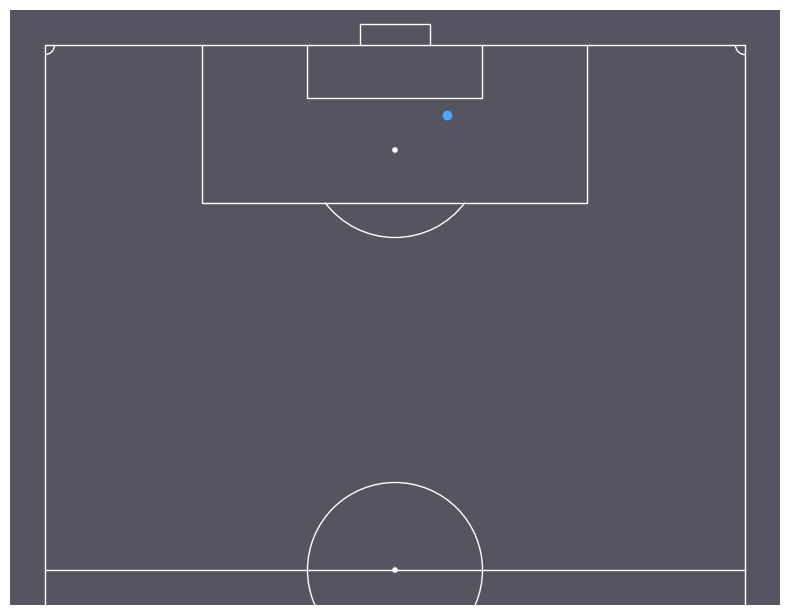

In [3]:

import pandas as pd
import numpy as np
import math
from mplsoccer import VerticalPitch, Pitch
width = 7.32
pitch = VerticalPitch(half=True, goal_type='box', corner_arcs=True, pitch_color='#545560', line_color='white', linewidth=1)

fig, ax = pitch.draw(figsize=(8,8))
sc = pitch.scatter(112, 46, 
                   ax=ax, color='#4da6ff', alpha=1.0, label='Shot')


data = pd.DataFrame(data)



# Separating the features and the target variable 
X = data[['distance','angle', 'header', 'shot-in-box', 'attack-type', 'prev-action', 'pass-length', 'prev-pass']]
Y = data[['goal']]

data.info()




## Logistic Regression

In [5]:

from sklearn import preprocessing

regressor = LogisticRegression(random_state=0)
# Fit the regressor with x and y data
regressor.fit(X, Y)

xG_map = np.zeros((100,80))

for x in range(100):
    for y in range(80):
        arr = np.array([calculate_dist(x,y), calculate_angle(x,y)])
        reshaped_arr = arr.reshape(1, -1)
        xG_map[x][y] = regressor.predict(reshaped_arr)



NameError: name 'LogisticRegression' is not defined

## Categorical gradient boosting

In [5]:
import catboost as cb
from catboost import Pool, CatBoostRegressor
import catboost as cb
import ipywidgets
xg_cat_boost = np.zeros((100,80))

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, brier_score_loss
from sklearn.metrics import classification_report

attack_type_mean = data.groupby('attack-type')['goal'].mean()

# Step 2: Map the mean values to the corresponding categories
X['attack-type'] = data['attack-type'].map(attack_type_mean)



X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.2, random_state=42, shuffle=True)

train_pool = Pool(X_train, 
                  y_train, text_features=[5])

test_pool = Pool(X_test,y_test, text_features=[5])


#Use Cross entropy loss to make sure the values is in the range 0-1
model = cb.CatBoostRegressor(loss_function='')


grid = {'iterations': [100, 150, 200, 250, 300],
        'learning_rate': [0.03, 0.1, 0.01, 0.15],
        'depth': [2, 4, 6, 8, 10],
        'l2_leaf_reg': [0.2, 0.5, 1, 3, 5]}


result = model.grid_search(grid, train_pool, plot=True)

pred = model.predict(X_test)

brier_score = brier_score_loss(y_test, pred)
rmse = (mean_squared_error(y_test, pred))
mae = (mean_absolute_error(y_test, pred))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('MSE: {:.4f}'.format(rmse))
print('R2: {:.4f}'.format(r2))
print('MAE: {:.4f}'.format(mae))
print('Standard error: {:.4f}'.format(np.sqrt(rmse)))
print('Brier score: {:.4f}'.format(brier_score))
print(result['params'])

# Print classification report for the Grid Search model

# for x in range(100):
#     for y in range(80):
#         arr = np.array([calculate_dist(x,y), calculate_angle(x,y), False])
#         reshaped_arr = arr.reshape(1, -1)
#         xg_cat_boost[x][y] = model.predict(reshaped_arr)

/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_6898/1999152067.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['attack-type'] = data['attack-type'].map(attack_type_mean)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.3221508	test: 0.3197745	best: 0.3197745 (0)	total: 58.1ms	remaining: 5.76s
1:	learn: 0.3204168	test: 0.3181431	best: 0.3181431 (1)	total: 59.4ms	remaining: 2.91s
2:	learn: 0.3187480	test: 0.3165898	best: 0.3165898 (2)	total: 60.3ms	remaining: 1.95s
3:	learn: 0.3171894	test: 0.3151275	best: 0.3151275 (3)	total: 61.2ms	remaining: 1.47s
4:	learn: 0.3157011	test: 0.3137370	best: 0.3137370 (4)	total: 62.1ms	remaining: 1.18s
5:	learn: 0.3142942	test: 0.3124252	best: 0.3124252 (5)	total: 63.4ms	remaining: 994ms
6:	learn: 0.3129648	test: 0.3111878	best: 0.3111878 (6)	total: 65.4ms	remaining: 868ms
7:	learn: 0.3117237	test: 0.3100269	best: 0.3100269 (7)	total: 67.1ms	remaining: 772ms
8:	learn: 0.3105453	test: 0.3089325	best: 0.3089325 (8)	total: 68.6ms	remaining: 694ms
9:	learn: 0.3094163	test: 0.3078895	best: 0.3078895 (9)	total: 69.5ms	remaining: 626ms
10:	learn: 0.3083586	test: 0.3069113	best: 0.3069113 (10)	total: 70.5ms	remaining: 570ms
11:	learn: 0.3073662	test: 0.3059939	best

ValueError: y_prob contains values greater than 1.

## Best parameters with tests

In [7]:
attack_type_mean = data.groupby('attack-type')['goal'].mean()
from sklearn.metrics import mean_absolute_percentage_error
# Step 2: Map the mean values to the corresponding categories
X['attack-type'] = data['attack-type'].map(attack_type_mean)



X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.2, random_state=42, shuffle=True)

train_pool = Pool(X_train, 
                  y_train, text_features=[5])

test_pool = Pool(X_test,y_test, text_features=[5])

model = cb.CatBoostRegressor(loss_function='RMSE', depth=10, learning_rate=0.15, l2_leaf_reg=0.5, iterations=300)
model.fit(train_pool)

pred = model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
mae = (mean_absolute_error(y_test, pred))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('RMSE: {:.4f}'.format(rmse))
print('R2: {:.4f}'.format(r2))
print('MAE: {:.4f}'.format(mae))
# MAPE funkar inte bra för att vi ofta predictar värden nära 0 och då blir det stort output?



/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_6898/1331189895.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['attack-type'] = data['attack-type'].map(attack_type_mean)


0:	learn: 0.2970690	total: 22.1ms	remaining: 6.6s
1:	learn: 0.2902306	total: 44.9ms	remaining: 6.69s
2:	learn: 0.2847277	total: 66.5ms	remaining: 6.59s
3:	learn: 0.2805371	total: 88.7ms	remaining: 6.56s
4:	learn: 0.2775345	total: 111ms	remaining: 6.57s
5:	learn: 0.2755324	total: 115ms	remaining: 5.66s
6:	learn: 0.2734416	total: 138ms	remaining: 5.78s
7:	learn: 0.2719873	total: 162ms	remaining: 5.91s
8:	learn: 0.2707994	total: 184ms	remaining: 5.94s
9:	learn: 0.2699496	total: 206ms	remaining: 5.99s
10:	learn: 0.2691532	total: 228ms	remaining: 5.98s
11:	learn: 0.2685620	total: 252ms	remaining: 6.06s
12:	learn: 0.2680447	total: 275ms	remaining: 6.08s
13:	learn: 0.2675702	total: 297ms	remaining: 6.07s
14:	learn: 0.2669141	total: 320ms	remaining: 6.08s
15:	learn: 0.2664321	total: 344ms	remaining: 6.1s
16:	learn: 0.2660823	total: 367ms	remaining: 6.11s
17:	learn: 0.2656832	total: 390ms	remaining: 6.11s
18:	learn: 0.2654999	total: 413ms	remaining: 6.11s
19:	learn: 0.2652761	total: 436ms	remai

## Metrics 

In [ ]:
print("Mean: ", pred.mean())
print("Min :",pred.min())
print("Max :",pred.max())


rmse = (np.sqrt(mean_squared_error(y_test, pred)))
mae = (mean_absolute_error(y_test, pred))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('RMSE: {:.4f}'.format(rmse))
print('R2: {:.4f}'.format(r2))
print('MAE: {:.4f}'.format(mae))

for i in range(len(pred)):
    if pred[i] > 1:
        pred[i] = 1
    if pred[i] < 0:
        pred[i] = 0

brier_score = brier_score_loss(y_test, pred)
print('Brier score: {:.4f}'.format(brier_score))


fpr, tpr, thresholds = metrics.roc_curve(y_test, pred, pos_label=1)
print("AUC: ", metrics.auc(fpr, tpr))

## Plot  the line regression

[ 0.05251736  0.12758541  0.03174557 ... -0.01752184  0.01982816
  0.02198378]


TypeError: expected 1D vector for x

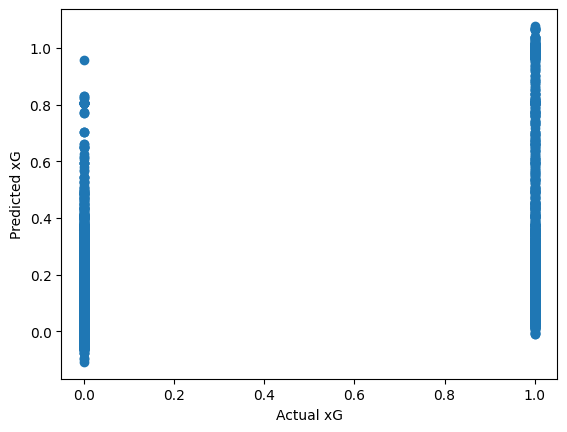

In [15]:
import scipy as sp
import matplotlib.pyplot as plt
print(pred)
r_squared = 0.3331
plt.scatter(y_test,pred)
plt.xlabel('Actual xG')
plt.ylabel('Predicted xG')

plt.plot(np.unique(y_test), np.poly1d(np.polyfit(y_test, pred, 1))(np.unique(y_test)))
plt.text(0.6, 0.5, 'R-squared = %0.2f' % r_squared)
plt.show()


## Bayesian regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn import linear_model
from sklearn import preprocessing

print(X)
x_normalized = preprocessing.normalize(X,norm="l2")
print(x_normalized)
reg = linear_model.BayesianRidge(compute_score=True)
reg.fit(x_normalized,Y)
xG_bayesian = np.zeros((100,80))
for x in range(100):
    for y in range(80):
        arr = np.array([calculate_dist(x,y), calculate_angle(x,y)])
        reshaped_arr = arr.reshape(1, -1)
        xG_bayesian[x][y] = reg.predict(reshaped_arr)



        distance      angle
0       7.879086  36.299641
1      15.367498  20.144519
2      14.422205  25.467230
3       8.207314  32.261448
4      11.454257  15.950743
...          ...        ...
17387  15.939887   8.219666
17388  27.364210  11.870577
17389  10.829589  31.198571
17390  36.810868  10.566286
17391  48.373546   7.876793

[17392 rows x 2 columns]
[[0.21211755 0.97724416]
 [0.60652488 0.7950645 ]
 [0.49277396 0.87015735]
 ...
 [0.32792392 0.94470414]
 [0.96118598 0.27590128]
 [0.9870007  0.16071595]]


/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_15101/151574716.py:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  xG_bayesian[x][y] = reg.predict(reshaped_arr)
/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_15101/151574716.py:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  xG_bayesian[x][y] = reg.predict(reshaped_arr)
/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_15101/151574716.py:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.

## Random forest

/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_7902/256228880.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['attack-type'].fillna('other', inplace=True)
/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_7902/256228880.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['prev-action'].fillna('other', inplace=True)
/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_7902/256228880.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.ht

[35 27 25 ... 11  0  0]
Mean absolute error:  0.15079428254397848
Mean squared error:  0.07368187141119623
Cross val mse:  0.175611232941618


/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_7902/256228880.py:63: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  xG_randomforest[x][y] = regr.predict(reshaped_arr)
/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_7902/256228880.py:63: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  xG_randomforest[x][y] = regr.predict(reshaped_arr)
/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_7902/256228880.py:63: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated N

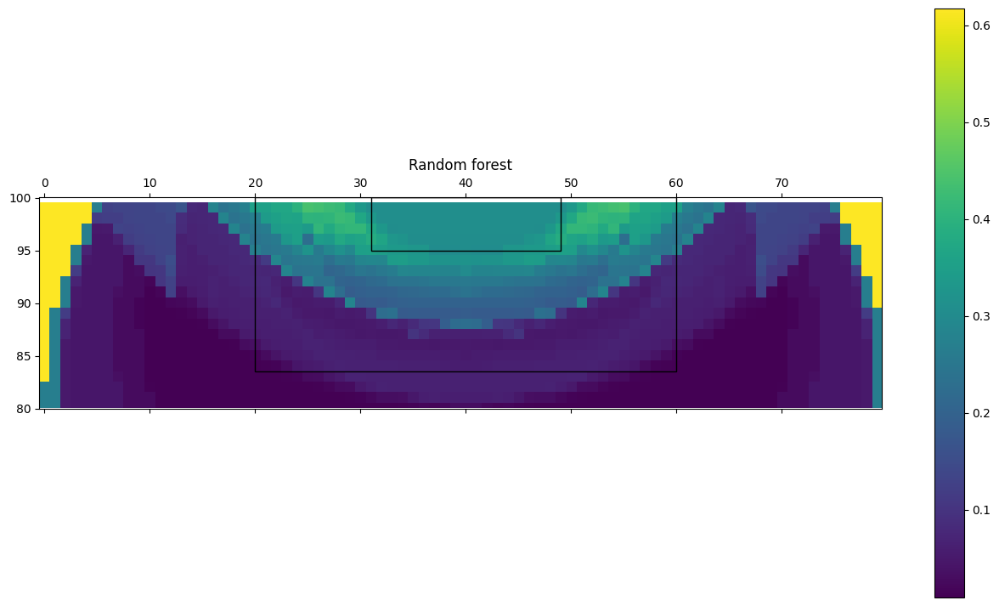

In [ ]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.patches as patches
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error

le = LabelEncoder()
le2 = LabelEncoder()
X['attack-type'].fillna('other', inplace=True)  
X['prev-action'].fillna('other', inplace=True)  

le.fit(X['attack-type'])
le2.fit(X['prev-action'])
transformed_attack = le.transform(X['attack-type'])
transformed_prev = le2.transform(X['prev-action'])
X.drop('prev-action', axis = 1, inplace= True)
X.drop('attack-type', axis = 1, inplace = True)

print(transformed_prev)
X['attack-type'] = transformed_attack
X['prev-action'] = transformed_prev
X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.2, random_state=42, shuffle=True)


regr = RandomForestRegressor(max_depth= 5, random_state=0, n_estimators=400)

scorers = ['neg_mean_absolute_error', 'neg_root_mean_squared_error', 'r2', 'accuracy']

clr = regr.fit(X_train, y_train)

prediction = clr.predict(X_test)

mae = mean_absolute_error(y_test, prediction)

mse = mean_squared_error(y_test, prediction)

print("Mean absolute error: ", mae)
print("Mean squared error: ", mse)



score = cross_val_score(clr, X_test, y_test, cv=5, )

print("Cross val mse: ", score.mean())


#  0   distance     30383 non-null  float64
#  1   angle        30383 non-null  float64
#  2   header       30383 non-null  bool   
#  3   shot-in-box  30383 non-null  bool   
#  4   attack-type  11914 non-null  object 
#  5   prev-action  30383 non-null  object 
#  6   pass-length  30383 non-null  float64
#  7   prev-pass    30383 non-null  bool 


xG_randomforest = np.zeros((100,80))
for x in range(100):
    for y in range(80):
        arr = np.array([calculate_dist(x,y), calculate_angle(x,y), False ,shot_in_box(x,y), 5, 0, 10, True])
        reshaped_arr = arr.reshape(1, -1)
        xG_randomforest[x][y] = regr.predict(reshaped_arr)

square = patches.Rectangle(xy=(31, 95),width= 18,height= 5, edgecolor='black', facecolor='none')
square2 = patches.Rectangle(xy=(20, 83.5),width= 40,height= 16.5, edgecolor='black', facecolor='none')

figure = plt.figure(figsize=(16,9))
axes = figure.add_subplot(1,1,1)
axes.set_title("Random forest")
axes.set_ylim(bottom=80,top=100)
caxes = axes.matshow(xG_randomforest, interpolation ='nearest', alpha = 1)
figure.colorbar(caxes)
axes.add_patch(square)
axes.add_patch(square2)





## Gradient boosting regressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

le = LabelEncoder()
X['attack-type']= le.fit_transform(X['attack-type']) 

reg = GradientBoostingRegressor(random_state=0, learning_rate=0.5, n_estimators= 400, max_depth=1)

reg.fit(X,Y)



# xG_gradient = np.zeros((100,80))
# for x in range(100):
#     for y in range(80):
#         arr = np.array([calculate_dist(x,y), calculate_angle(x,y), False, 5, shot_in_box(x,y)])
#         reshaped_arr = arr.reshape(1, -1)
#         xG_gradient[x][y] = reg.predict(reshaped_arr)

# square = patches.Rectangle(xy=(31, 95),width= 18,height= 5, edgecolor='black', facecolor='none')
# square2 = patches.Rectangle(xy=(20, 83.5),width= 40,height= 16.5, edgecolor='black', facecolor='none')

# figure = plt.figure(figsize=(16,9))
# axes = figure.add_subplot(1,1,1)
# axes.set_title("Gradient boosting")
# axes.set_ylim(bottom=80,top=100)
# caxes = axes.matshow(xG_gradient, interpolation ='nearest', alpha = 1)
# figure.colorbar(caxes)
# axes.add_patch(square)
# axes.add_patch(square2)
# plt.show()


/var/folders/cn/b4r618q142sb6srpvcxf2jlw0000gn/T/ipykernel_7902/912236499.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['attack-type']= le.fit_transform(X['attack-type'])


ValueError: could not convert string to float: 'Tackle unsuccessful'

## Plotting the heatmap for the xG

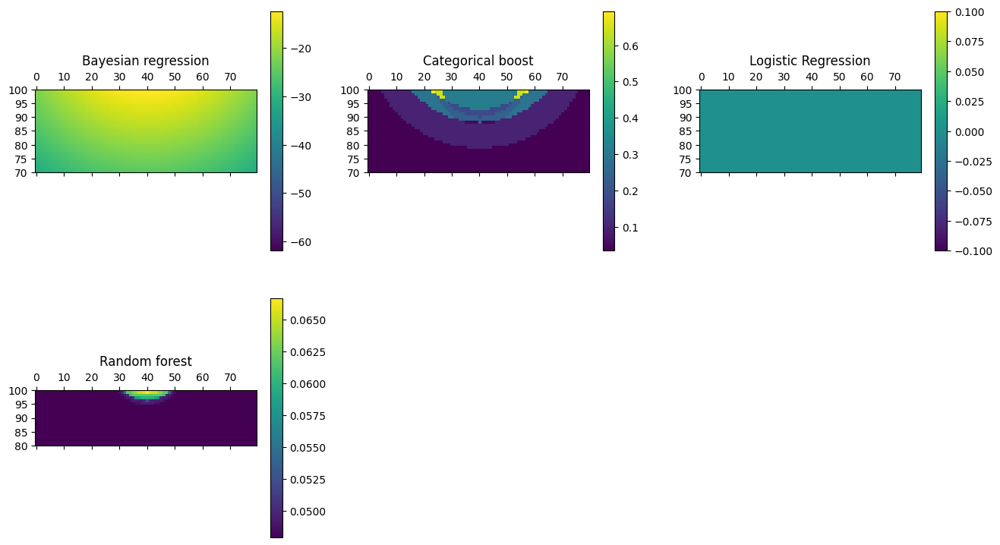

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# a 2D array with linearly increasing values on the diagonal

figure = plt.figure(figsize=(16,9))
axes = figure.add_subplot(2,3,1)
axes.set_title("Bayesian regression")
axes.set_ylim(bottom=70,top=100)
caxes = axes.matshow(xG_bayesian, interpolation ='nearest', )
figure.colorbar(caxes)


axes2 = figure.add_subplot(2,3,2)
axes2.set_title("Categorical boost")
axes2.set_ylim(bottom=70,top=100)

caxes2 = axes2.matshow(xg_cat_boost, interpolation ='nearest')
figure.colorbar(caxes2)

axes3 = figure.add_subplot(2,3,3)
axes3.set_title("Logistic Regression")
axes3.set_ylim(bottom=70,top=100)

caxes3 = axes3.matshow(xG_map, interpolation ='nearest')
figure.colorbar(caxes3)

axes4 = figure.add_subplot(2,3,4)
axes4.set_title("Random forest")
axes4.set_ylim(bottom=80,top=100)
caxes4 = axes4.matshow(xG_randomforest, interpolation ='nearest')
figure.colorbar(caxes4)
plt.show()





In [ ]:

# Evaluating the model
from sklearn.metrics import mean_squared_error, r2_score
 
# Access the OOB Score
oob_score = regressor.oob_score_
print(f'Out-of-Bag Score: {oob_score}')
 
# Making predictions on the same data or new data
predictions = regressor.predict(X)
 
# Evaluating the model
mse = mean_squared_error(y, predictions)
print(f'Mean Squared Error: {mse}')
 
r2 = r2_score(y, predictions)
print(f'R-squared: {r2}')

Out-of-Bag Score: 0.0251189436311402
Mean Squared Error: 0.08133839179774717
R-squared: 0.186577185953832
